In [11]:
import missingno
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split

In [12]:
plt.rcParams["font.size"] = 18
plt.rcParams["axes.grid"] = True
plt.rcParams["figure.figsize"] = 12,8
plt.rcParams['font.serif'] = "Cambria"
plt.rcParams['font.family'] = "serif"

In [14]:
CV = pd.read_csv("val_processed.csv",index_col = 0)
test = pd.read_csv("test_processed.csv",index_col = 0)
train = pd.read_csv("train_processed.csv",index_col = 0)

In [21]:
df_new = train.iloc[:,:17]
df_val = CV.iloc[:,:17]
df_test = test.iloc[:,:17]

In [25]:
df_val = df_val[feature_columns]
df_test = df_test[feature_columns]

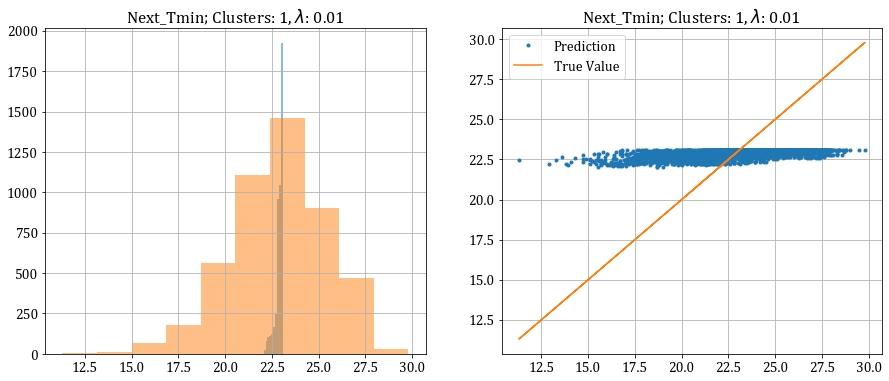

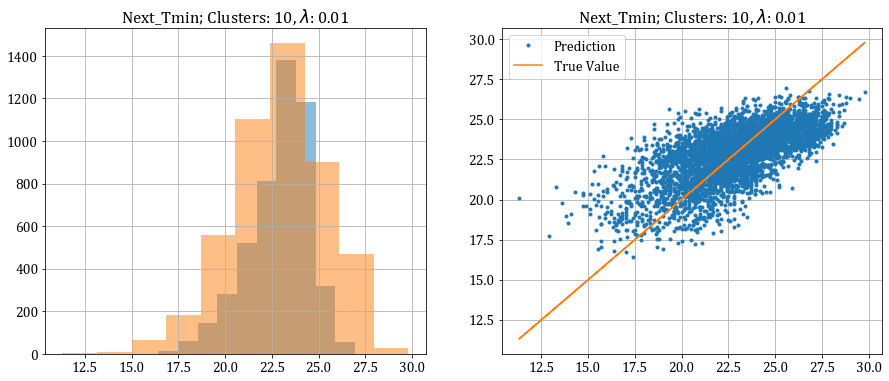

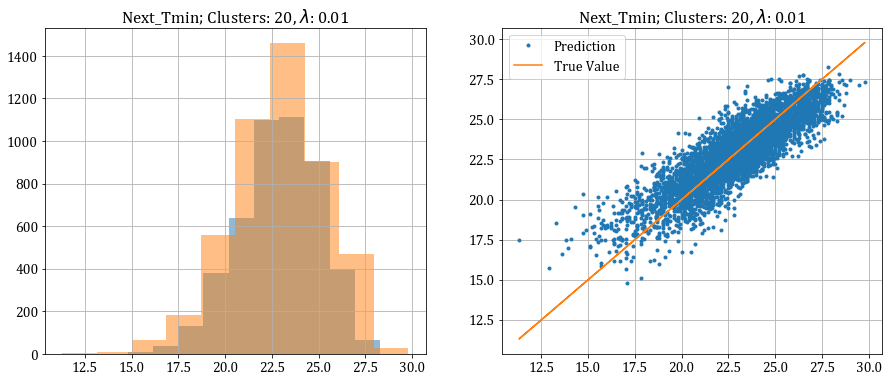

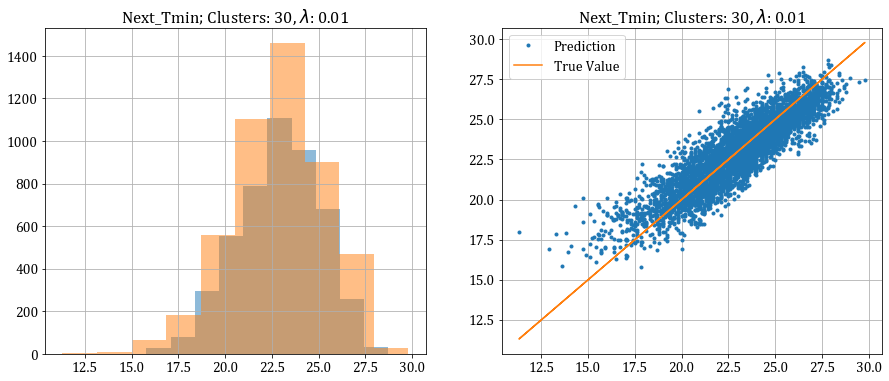

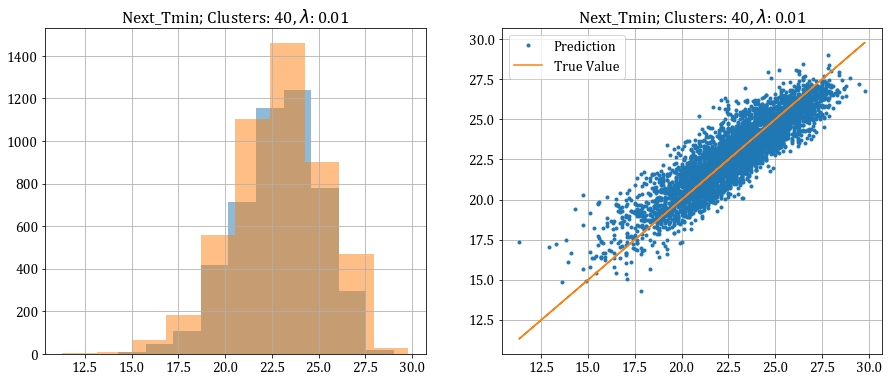

...

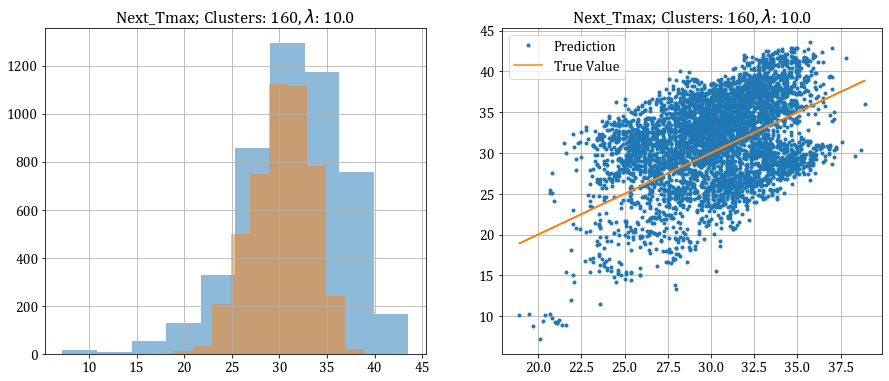

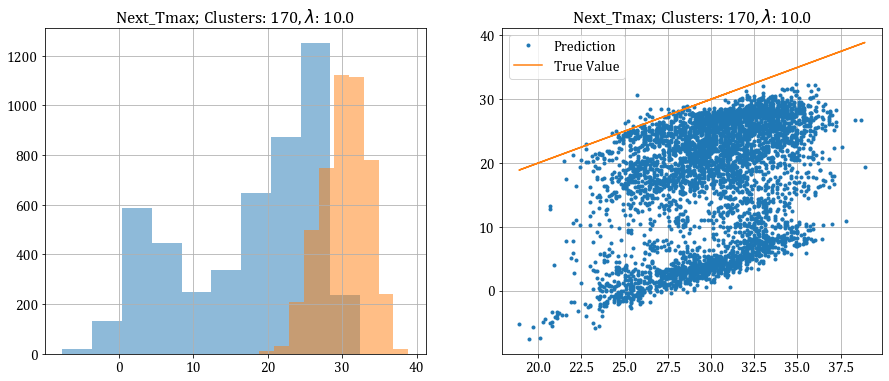

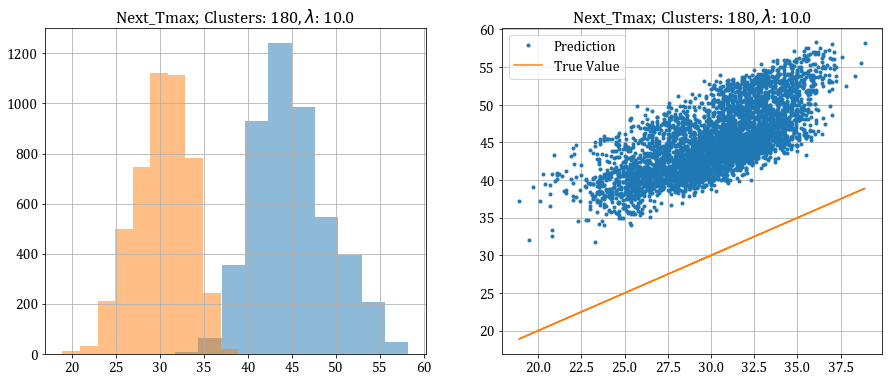

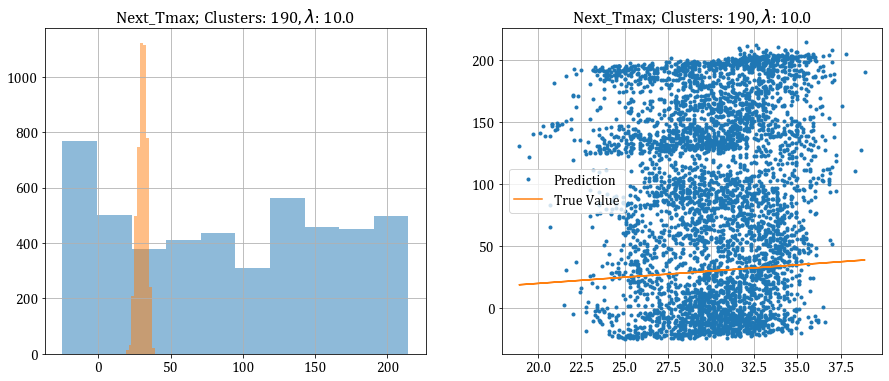

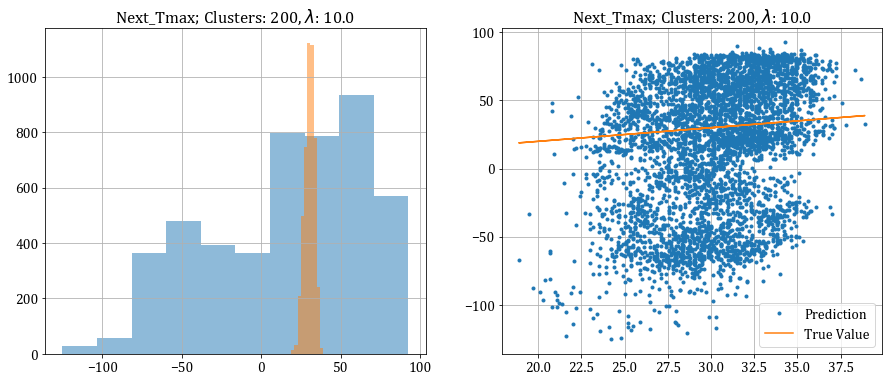

In [76]:
num_clusters = [1]
num_clusters.extend(range(10, 201, 10))

lambda_list = [0.01, 0.1,  1.0, 5.0, 10.0]

nclu_rep_list = []
lambda_rep_list = []
min_overall_sse = []
max_overall_sse = []
min_overall_error = []
max_overall_error = []
min_overall_val_error = []
max_overall_val_error = []
min_overall_kmeans = []
max_overall_kmeans = []
min_overall_label = []
max_overall_label = []
min_overall_cluster_center = []
max_overall_cluster_center = []
min_overall_val_label = []
max_overall_val_label = []
min_overall_test_error = []
max_overall_test_error = []
min_overall_test_label = []
max_overall_test_label = []

for lmbda in lambda_list:
    
    min_sse_list, min_error_list, min_val_error_list, min_kmeans_list, min_label_list, min_cluster_centers_list, min_val_label_list, min_test_error_list, min_test_label_list = gaussian_basis_fit(num_clusters, train.iloc[:,:17], df_val, df_test, train, CV, test, lmbda=lmbda, fit_var="T_min")
    min_overall_sse.extend(min_sse_list)
    min_overall_error.extend(min_error_list)
    min_overall_val_error.extend(min_val_error_list)
    min_overall_kmeans.extend(min_kmeans_list)
    min_overall_label.extend(min_label_list)
    min_overall_cluster_center.extend(min_cluster_centers_list)
    min_overall_val_label.extend(min_val_label_list)
    min_overall_test_error.extend(min_test_error_list)
    min_overall_test_label.extend(min_test_label_list)
    
    max_sse_list, max_error_list, max_val_error_list, max_kmeans_list, max_label_list, max_cluster_centers_list, max_val_label_list, max_test_error_list, max_test_label_list = gaussian_basis_fit(num_clusters, train.iloc[:,:17], df_val, df_test, train, CV, test, lmbda=lmbda, fit_var="T_max")
    max_overall_sse.extend(max_sse_list)
    max_overall_error.extend(max_error_list)
    max_overall_val_error.extend(max_val_error_list)
    max_overall_kmeans.extend(max_kmeans_list)
    max_overall_label.extend(max_label_list)
    max_overall_cluster_center.extend(max_cluster_centers_list)
    max_overall_val_label.extend(max_val_label_list)
    max_overall_test_error.extend(max_test_error_list)
    max_overall_test_label.extend(max_test_label_list)
    
    lambda_rep_list.extend([lmbda]*len(min_sse_list))
    nclu_rep_list.extend(num_clusters)

In [99]:
max_df_error = max_df_error.round(decimals = 3)
min_df_error = min_df_error.round(decimals = 3)
min_df_error.to_csv("t3_d3_tikh_min.csv",index = False)
max_df_error.to_csv("t3_d3_tikh_max.csv",index = False)

In [98]:
min_df_error

,Clusters,lambda,Error,Validation Error,Test Error
93,90,10.00,1.038,1.102,1.063
71,80,5.00,1.049,1.110,1.066
29,80,0.10,1.054,1.111,1.068
9,90,0.01,1.055,1.112,1.083
49,70,1.00,1.060,1.113,1.068
...,...,...,...,...,...
20,200,0.01,34.399,35.076,34.697
83,200,5.00,38.365,37.433,38.111
19,190,0.01,43.547,44.292,43.828
38,170,0.10,46.852,46.002,46.340


In [78]:
min_error_list = np.array(min_error_list)
min_val_error_list = np.array(min_val_error_list)
min_df_error = pd.DataFrame({"Clusters":nclu_rep_list, "lambda":lambda_rep_list, \
                             "Error":min_overall_error, "Validation Error":min_overall_val_error, \
                             "Test Error":min_overall_test_error})
min_df_error.sort_values(by=["Validation Error"], ascending=True, inplace=True)
min_df_error.to_csv("t3_d3_tikh_min.csv")
display(min_df_error)

max_error_list = np.array(max_error_list)
max_val_error_list = np.array(max_val_error_list)
max_df_error = pd.DataFrame({"Clusters":nclu_rep_list, "lambda":lambda_rep_list, \
                             "Error":max_overall_error, "Validation Error":max_overall_val_error, \
                             "Test Error":max_overall_test_error})

max_df_error.sort_values(by=["Validation Error"], ascending=True, inplace=True)
max_df_error.to_csv("t3_d3_tikh_max.csv")
display(max_df_error)

,Clusters,lambda,Error,Validation Error,Test Error
93,90,10.00,1.038414,1.102474,1.062700
71,80,5.00,1.049303,1.109714,1.065534
29,80,0.10,1.053775,1.111067,1.067799
9,90,0.01,1.055415,1.112145,1.082836
49,70,1.00,1.060048,1.113161,1.068447
...,...,...,...,...,...
20,200,0.01,34.398723,35.076020,34.696921
83,200,5.00,38.364746,37.433425,38.111024
19,190,0.01,43.547168,44.292341,43.827973
38,170,0.10,46.851945,46.001595,46.339922


,Clusters,lambda,Error,Validation Error,Test Error
9,90,0.01,1.453850,1.467393,1.474105
72,90,5.00,1.443912,1.468825,1.465582
29,80,0.10,1.472632,1.477423,1.491238
71,80,5.00,1.479508,1.479491,1.504762
93,90,10.00,1.463724,1.481714,1.496655
...,...,...,...,...,...
80,170,5.00,41.161700,41.773726,40.879920
104,200,10.00,49.602424,50.006612,49.203229
19,190,0.01,56.979915,57.847961,57.341046
103,190,10.00,93.790005,96.404382,94.553869


In [72]:
from tikhonov_reg import *

In [86]:
def f(ds,n_clu):
        
    n_feat = ds.shape[1]-1
    X = ds.iloc[:,:n_feat]
    cluster_centers_list = []
    label_list = []
    
    kmeans = KMeans(n_clusters=n_clu, random_state=42).fit(ds.to_numpy())
    #sse_list.append(kmeans.inertia_)
    label_list.append(kmeans.labels_)
    cluster_centers_list.append(kmeans.cluster_centers_)  

    mean_centers = cluster_centers_list[-1]
    corresponding_center = mean_centers[label_list[-1],:]

    X = df_new.to_numpy()
    X_val = df_val.to_numpy()
    #val_labels = kmeans.predict(X_val)
    
    distance = np.linalg.norm(X-corresponding_center, axis=1)
    var = np.var(distance)*distance.size

    phi = np.ones((X.shape[0], 1))
    phi_val = np.ones((X_val.shape[0], 1))
    
    for i in range(n_clu):
        A = np.exp(-np.linalg.norm(X-mean_centers[i,:], axis=1)**2/var)
        
        phi = np.append(phi, A.reshape(-1,1), axis=1)


    return(phi,mean_centers,var)


In [23]:
from sklearn.cluster import KMeans

In [94]:
# use 90, 10 -> min

# 90, 0.01  -> max

phi_train, centers, sig = f(df_new,90)
W1 = tikhonov_reg(phi_train,centers,sig,10) @ train["Next_Tmin"]
W2 = tikhonov_reg(phi_train,centers,sig,10) @ train["Next_Tmax"]
phi_test = np.ones((test.iloc[:,:17].shape[0], 1))
for i in range(90):
    phi_test = np.append(phi_test, np.exp(-np.linalg.norm(test.iloc[:,:17]-centers[i,:], axis=1)**2/sig).reshape(-1,1), axis=1)
train_pred_min=phi_train @ W1
train_pred_max=phi_train @ W2

test_pred_min=phi_test @ W1
test_pred_max=phi_test @ W2

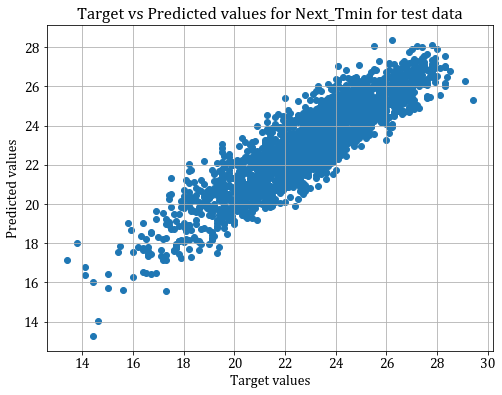

In [100]:
plt.scatter(test["Next_Tmin"],test_pred_min)
plt.xlabel("Target values")
plt.ylabel("Predicted values")
plt.title("Target vs Predicted values for Next_Tmin for test data")
plt.savefig("test_ds3_tikh_min.png")
plt.show()

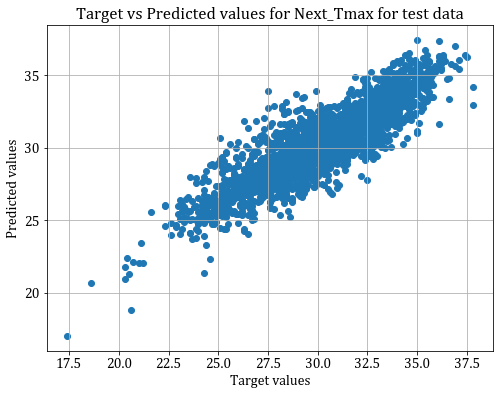

In [102]:
plt.scatter(test["Next_Tmax"],test_pred_max)
plt.xlabel("Target values")
plt.ylabel("Predicted values")
plt.title("Target vs Predicted values for Next_Tmax for test data")
plt.savefig("test_ds3_tikh_max.png")
plt.show()